# Prerequisite

## Participating the Competition
먼저 Kaggle 계정을 만든 후에, 다음 링크에서 Kaggle Competition에 참가:

주의: 참가 시 Team - Team Name을 **학번 / 이름**으로 설정

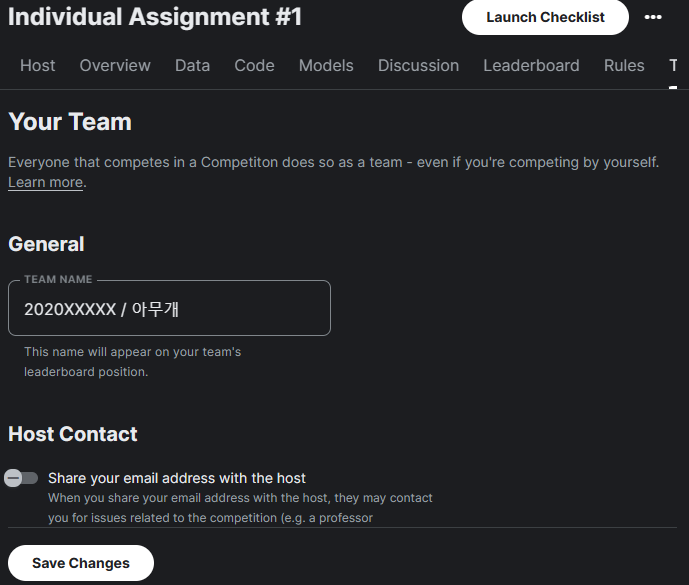

## Data Download

Kaggle 프로필 아이콘 - Settings - API - Create New Token 선택 후 다운로드 된 **kaggle.json**에서, **username**과 **key** 값을 아래에 기록

In [ ]:
USERNAME = "liebenholz" # username
USERKEY = "" # key

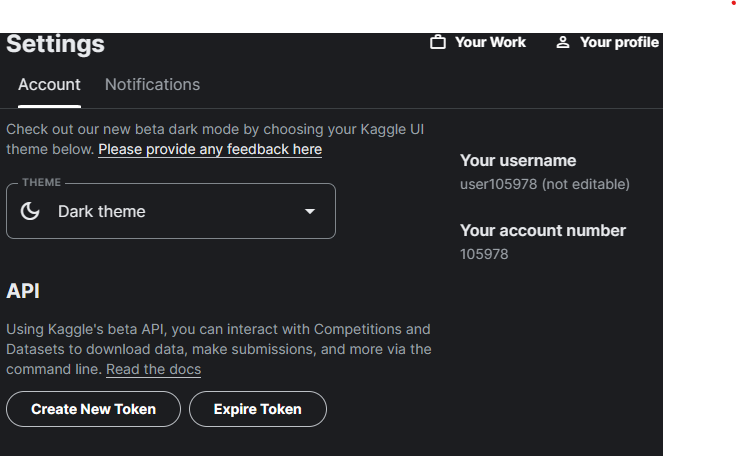

Kaggle 인증 정보 생성


In [2]:
import json


json.dump({'username': USERNAME, 'key': USERKEY}, open('kaggle.json', mode='w'))

만약 Colab이 아닌 로컬 환경에서 하고 싶다면 OS에 따라 인증 정보 설정 방법이 다르므로, [Kaggle API](https://github.com/Kaggle/kaggle-api)를 참조

In [3]:
!mkdir ~/.kaggle/
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download --force 2024-knu-ml-ind-asmt1
!unzip 2024-knu-ml-ind-asmt1.zip

  0% 0.00/517k [00:00<?, ?B/s]
100% 517k/517k [00:00<00:00, 73.6MB/s]
Archive:  2024-knu-ml-ind-asmt1.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


## Installing Libraries
* [scikit-learn](https://scikit-learn.org/stable/index.html): 다목적 기계 학습 라이브러리
* [numpy](https://numpy.org/): 배열 유틸리티
* [pandas](https://pandas.pydata.org/): 데이터 활용 유틸리티
* [altair](https://altair-viz.github.io/index.html): 시각화
* [kaggle](https://github.com/Kaggle/kaggle-api): Kaggle API 활용

In [4]:
!pip install -q scikit-learn==1.4.1.post1 numpy pandas altair kaggle==1.6.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.6/84.6 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


# Data Exploration / Preprocessing

다운로드 받은 데이터를 Pandas Dataframe으로 불러옴

In [5]:
import pandas as pd


TRAIN = pd.read_csv('./train.csv', index_col='id')

데이터 예시

In [6]:
TRAIN.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
id,,,,,,,,,,
8158,-120.95,37.59,43.0,1561.0,354.0,862.0,332.0,1.8466,INLAND,81500.0
18368,-115.55,32.98,33.0,2266.0,365.0,952.0,360.0,5.4349,INLAND,143000.0
19197,-117.85,33.80,40.0,1461.0,286.0,1322.0,264.0,4.3269,<1H OCEAN,194100.0
3746,-118.35,33.91,26.0,2159.0,523.0,1331.0,520.0,3.8700,<1H OCEAN,264500.0
13073,-117.38,33.98,52.0,2274.0,571.0,1167.0,504.0,2.0284,INLAND,101600.0


입력 데이터
* id: Block의 id
* longitude: Block이 위치한 경도
* latitude: Block이 위치한 위도
* housing_median_age: Block 내의 건물의 나이
* total_rooms: Block 내 방의 수
* total_bedrooms: Block 내 침실의 수
* population: Block 내 거주하는 사람의 수
* households: Block 내 거주하는 가구의 수
* median_income: Block 내 수입 중간값
* ocean_proximity: 바닷가와의 인접도
    
출력 데이터
* median_house_value: Block 내의 집 가치 중간값($)

데이터 타입

In [7]:
TRAIN.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15480 entries, 8158 to 15795
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           15480 non-null  float64
 1   latitude            15480 non-null  float64
 2   housing_median_age  15480 non-null  float64
 3   total_rooms         15480 non-null  float64
 4   total_bedrooms      15335 non-null  float64
 5   population          15480 non-null  float64
 6   households          15480 non-null  float64
 7   median_income       15480 non-null  float64
 8   ocean_proximity     15480 non-null  object 
 9   median_house_value  15480 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.3+ MB


Pandas Dataframe에서 object 데이터 타입은 보통 문자열 등의 범주형Categorical 데이터, int 또는 float는 수치형Numerical 데이터로 이해하면 됨

## Check Missing Data

데이터가 결측치가 없이 제대로 수집되어 있는지 확인

In [8]:
for c in TRAIN.columns:
    print(f'{c}: {len(TRAIN[c].loc[TRAIN[c].isnull()])}')

longitude: 0
latitude: 0
housing_median_age: 0
total_rooms: 0
total_bedrooms: 145
population: 0
households: 0
median_income: 0
ocean_proximity: 0
median_house_value: 0


**total_bedrooms**에 결측치가 있는 샘플이 145개가 존재함. 전체 샘플 15480개 중 145개 정도면 1% 미만이므로, 과감하게 결측치가 있는 샘플을 삭제

In [9]:
TRAIN = TRAIN.dropna()

for c in TRAIN.columns:
    print(f'{c}: {len(TRAIN[c].loc[TRAIN[c].isnull()])}')

longitude: 0
latitude: 0
housing_median_age: 0
total_rooms: 0
total_bedrooms: 0
population: 0
households: 0
median_income: 0
ocean_proximity: 0
median_house_value: 0



## Exploration: Geographical Data

행정 구역별 집값의 관계를 살펴보기 위하여, 지도 위에 latitude, longitude별  median_house_value를 시각화

In [10]:
import altair as alt
from vega_datasets import data


alt.data_transformers.disable_max_rows() # 5000개 이상의 샘플을 처리할 수 있도록 설정

states = alt.topo_feature(data.us_10m.url, feature='states') # 미국 지도 데이터 출력

chart_back = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).properties(
    width=500,
    height=500
)

chart_main =  alt.Chart(TRAIN).encode(
    longitude = alt.Longitude('longitude:Q'),
    latitude = alt.Latitude('latitude:Q'),
    color = alt.Color('median_house_value:Q', scale=alt.Scale(scheme = 'viridis'))
).mark_point(filled=True)

(chart_back + chart_main).project(
    scale=1300,
    center=(-118, 37)
)

alt.LayerChart(...)

바닷가 인근에 위치해 있을수록 median_house_value가 대체적으로 높음

## Exploration: Continuous Variable


array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

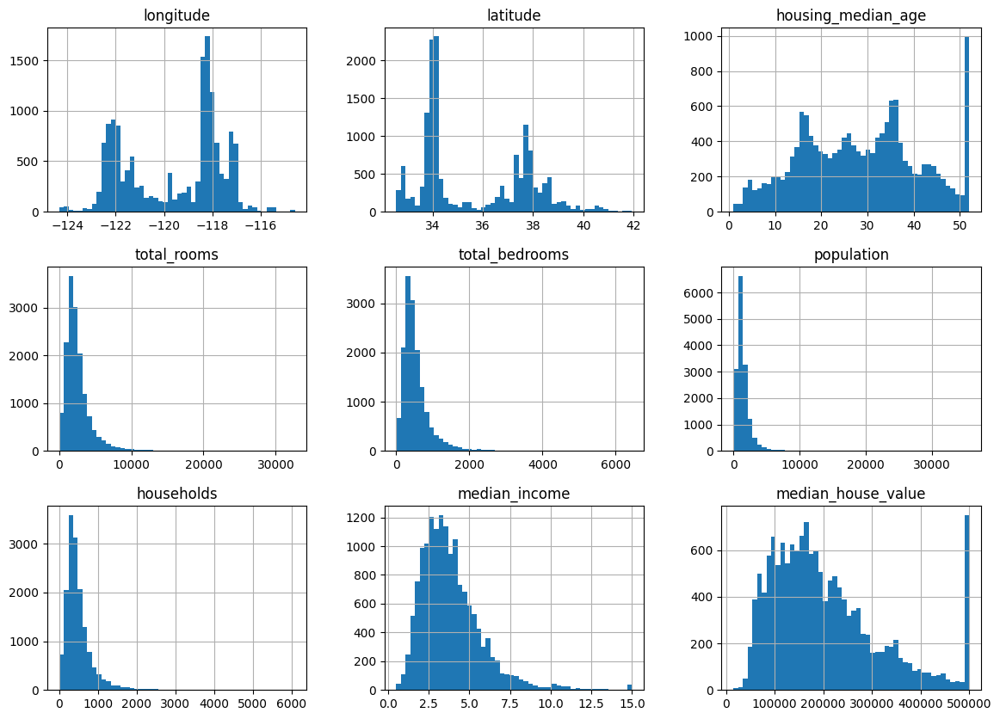

In [11]:
TRAIN.hist(bins = 50, figsize = (14, 10))

간단한 시각화로 몇 가지 사항을 알아낼 수 있음
* 각 데이터 별로 단위가 다름
* housing_median_age와 median_house_value의 경우 각각 50 또는 500,000만 달러에 굉장히 많은 샘플들이 집중적으로 모여 있음
* total_rooms, total_bedrooms, population, households 는 한 쪽으로 치우쳐진 분포를 보임.
    1. 실제로 기울어진 분포를 보이는 경우
    2. 이상치로 인한 경우

이상치의 존재 여부를 각 변수값의 분포로 다음과 같이 확인

In [12]:
TRAIN.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,15335.000000,15335.000000,15335.000000,15335.000000,15335.000000,15335.000000,15335.000000,15335.000000,15335.000000
mean,-119.568863,35.636222,28.557679,2636.182458,538.589501,1426.721813,500.021715,3.862908,206261.389175
std,2.003189,2.136680,12.625529,2141.749875,416.606938,1135.026588,378.280172,1.899759,114831.545721
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.790000,33.935000,18.000000,1460.000000,296.000000,788.000000,281.000000,2.560150,119300.000000
50%,-118.490000,34.260000,29.000000,2131.000000,437.000000,1170.000000,411.000000,3.526800,179400.000000
75%,-118.010000,37.720000,37.000000,3149.000000,648.000000,1724.000000,606.000000,4.725800,263850.000000
max,-114.580000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


total_rooms, total_bedrooms의 경우 최대값이 지나치게 높은 것을 확인 가능함. 예를 들어, 한 행정 구역당 총 방의 갯수가 32,627이라는 것은 (가능할 수는 있겠으나) 아주 극단적인 경우라고 생각이 듦



### Preprocessing: Log Scaling

극단적인 값들의 영향을 줄이고 분포를 고르게 만드는 방법 중 하나는 로그를 취하는 것

array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

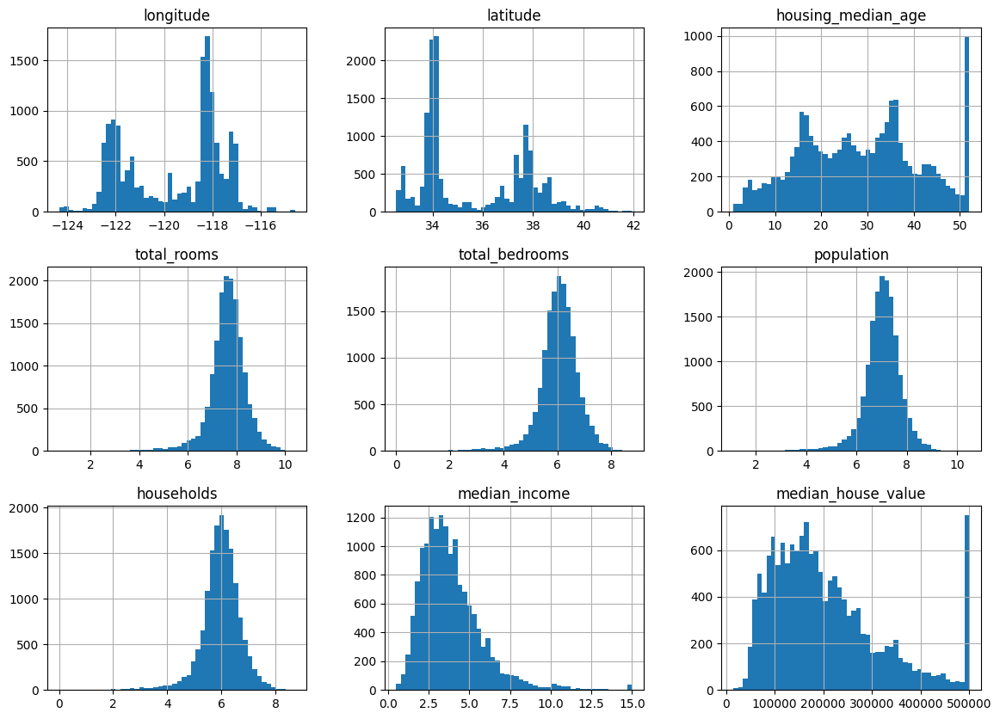

In [13]:
import numpy as np


TRAIN_LOG = TRAIN.assign(
    total_rooms = lambda x: np.log(x['total_rooms']),
    total_bedrooms = lambda x: np.log(x['total_bedrooms']),
    population = lambda x: np.log(x['population']),
    households = lambda x: np.log(x['households'])
)

TRAIN_LOG.hist(bins = 50, figsize = (14, 10))

로그를 적용함으로써 한쪽으로 치우친 분포가 상당 부분 개선됨을 알 수 있음



### Preprocessing: Outlier Removal

더욱 분포를 고르게 하기 위해서 이상치까지 제거함

In [14]:
import numpy as np
from sklearn.ensemble import IsolationForest

OUTLIERS = IsolationForest(random_state=42).fit_predict(
    TRAIN_LOG.drop(['ocean_proximity'], axis=1)
)
np.unique(OUTLIERS, return_counts=True)

(array([-1,  1]), array([ 2140, 13195]))

2,140개의 샘플이 이상치 (-1)인 것으로 예측됨. 이러한 샘플들을 제거함

array([[<Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'housing_median_age'}>],
       [<Axes: title={'center': 'total_rooms'}>,
        <Axes: title={'center': 'total_bedrooms'}>,
        <Axes: title={'center': 'population'}>],
       [<Axes: title={'center': 'households'}>,
        <Axes: title={'center': 'median_income'}>,
        <Axes: title={'center': 'median_house_value'}>]], dtype=object)

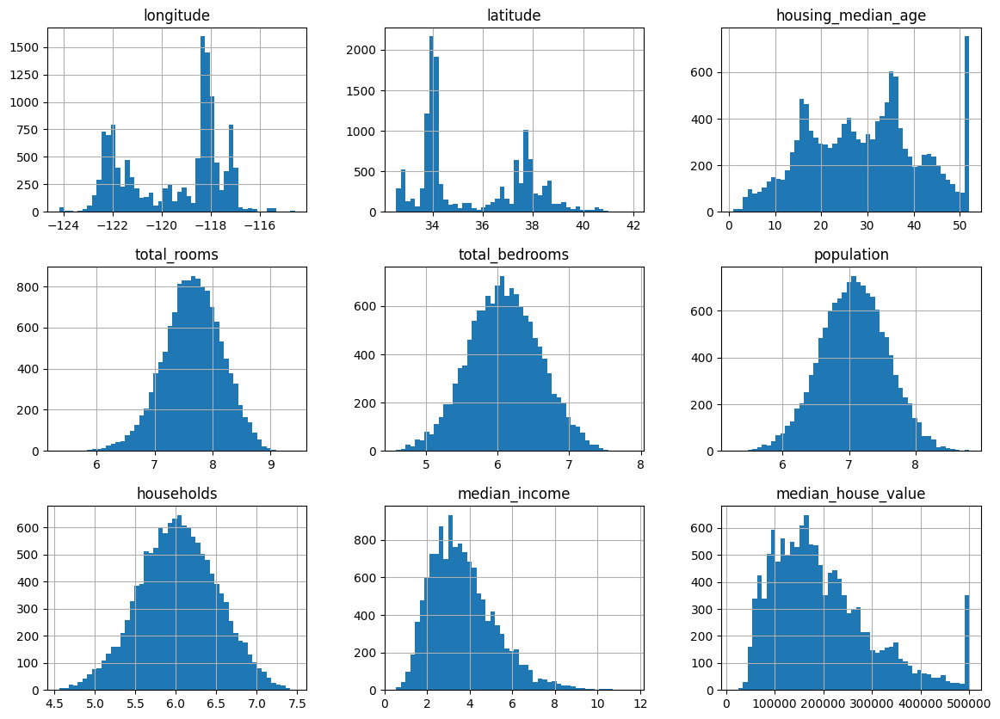

In [15]:
TRAIN_CLEAN = TRAIN_LOG.loc[OUTLIERS != -1, :]

TRAIN_CLEAN.hist(bins = 50, figsize = (14, 10))

아까보다 더욱 고른 분포를 보이는 것을 알 수 있음. **하지만, 데이터와 문제 분야에 따라서 이런 전처리 작업들이 되려 성능을 떨어트릴 수도 있음**

정제된 데이터들과 집값 간의 상관 관계를 확인함

In [16]:
TRAIN_CLEAN.corr(numeric_only=True)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.927309,-0.102245,0.018335,0.064473,0.148005,0.062625,-0.004644,-0.033449
latitude,-0.927309,1.000000,0.005108,-0.009206,-0.069560,-0.162256,-0.087675,-0.082677,-0.155254
housing_median_age,-0.102245,0.005108,1.000000,-0.331512,-0.271232,-0.244192,-0.246597,-0.135691,0.129792
total_rooms,0.018335,-0.009206,-0.331512,1.000000,0.894277,0.764037,0.885833,0.269170,0.184205
total_bedrooms,0.064473,-0.069560,-0.271232,0.894277,1.000000,0.832281,0.972446,-0.057635,0.067003
population,0.148005,-0.162256,-0.244192,0.764037,0.832281,1.000000,0.870065,-0.037594,-0.061800
households,0.062625,-0.087675,-0.246597,0.885833,0.972446,0.870065,1.000000,-0.014594,0.091740
median_income,-0.004644,-0.082677,-0.135691,0.269170,-0.057635,-0.037594,-0.014594,1.000000,0.651442
median_house_value,-0.033449,-0.155254,0.129792,0.184205,0.067003,-0.061800,0.091740,0.651442,1.000000


median_income이 median_house_value와 약 65%의 상관 관계를 가지고 있음: 즉, median_income이 증가할때 마다 median_house_value 또한 굉장히 높은 확률로 증가함



In [17]:
import altair as alt


alt.Chart(
    TRAIN_CLEAN
).encode(
    x=alt.X('median_income'),
    y=alt.X('median_house_value'),
).mark_point(
    fillOpacity=0.2, filled=True
)

alt.Chart(...)

## Exploration: Categorical Variable

In [18]:
import altair as alt


alt.Chart(
    TRAIN_CLEAN
).encode(
    x=alt.X('ocean_proximity'),
    y=alt.X('median_house_value'),
).mark_boxplot().properties(
    width=500
)

alt.Chart(...)

바닷가와의 인접도를 나타내는 범주형 변수인 ocean_proximity는 위의 지리적 데이터의 시각화와 유사한 결과를 나타냄:
  * 섬에 있으면(ISLAND) median_house_value가 높음
  * 내륙에 있으면(INLAND) median_house_value가 낮음(단, 예외 경우가 굉장히 많이 존재함)

In [19]:
TRAIN_CLEAN['ocean_proximity'].value_counts()

<1H OCEAN     6051
INLAND        4111
NEAR OCEAN    1619
NEAR BAY      1410
ISLAND           4
Name: ocean_proximity, dtype: int64

범주형 데이터의 분포를 보면 ISLAND 를 가지는 샘플이 다른 값을 가지는 샘플에 비해 지나치게 작은 것(4개)을 알 수 있음. 따라서, ISLAND 값을 가지는 샘플이 명확하게 높은 median_house_value를 갖더라도 그 수가 너무 적기 때문에 대표성이 없을 것이라는 것을 예상할 수 있음

# Feature Extraction
이미 있는 입력 데이터를 특성값으로 사용할 수도 있지만, 별도의 특성값을 직관, 경험, 도메인 지식 등으로 생성할 수 있음
* rooms_per_house: 한 가구당 방의 갯수가 많다면 집값이 높을 것임
* people_per_house: 부자들이 사는 곳이라면 한 가구당 적은 사람들이 있을 것이므로, 한 가구당 사람의 수가 많다면 집값이 낮을 것임
* bedrooms_ratio: 전체 방 갯수 대비 침실의 갯수가 많다면, 잉여 방이 없다는 의미이므로 전체 방 갯수에서 침실이 차지하는 비중이 많다면 집값이 낮을 것임

In [20]:
TRAIN_FEAT = TRAIN_CLEAN.assign(
    rooms_per_house = lambda x: x['total_rooms'] / x['households'],
    people_per_house = lambda x: x['population'] / x['households'],
    bedrooms_ratio = lambda x: x['total_bedrooms'] / x['total_rooms'],
)

TRAIN_FEAT.corr(numeric_only=True)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_house,people_per_house,bedrooms_ratio
longitude,1.000000,-0.927309,-0.102245,0.018335,0.064473,0.148005,0.062625,-0.004644,-0.033449,-0.101063,0.141079,0.109838
latitude,-0.927309,1.000000,0.005108,-0.009206,-0.069560,-0.162256,-0.087675,-0.082677,-0.155254,0.171712,-0.116779,-0.137940
housing_median_age,-0.102245,0.005108,1.000000,-0.331512,-0.271232,-0.244192,-0.246597,-0.135691,0.129792,-0.059662,0.060416,-0.003294
total_rooms,0.018335,-0.009206,-0.331512,1.000000,0.894277,0.764037,0.885833,0.269170,0.184205,-0.136353,-0.435269,0.175739
total_bedrooms,0.064473,-0.069560,-0.271232,0.894277,1.000000,0.832281,0.972446,-0.057635,0.067003,-0.498920,-0.482027,0.596608
population,0.148005,-0.162256,-0.244192,0.764037,0.832281,1.000000,0.870065,-0.037594,-0.061800,-0.519206,0.022551,0.464920
households,0.062625,-0.087675,-0.246597,0.885833,0.972446,0.870065,1.000000,-0.014594,0.091740,-0.578289,-0.471058,0.551737
median_income,-0.004644,-0.082677,-0.135691,0.269170,-0.057635,-0.037594,-0.014594,1.000000,0.651442,0.493362,-0.046317,-0.597987
median_house_value,-0.033449,-0.155254,0.129792,0.184205,0.067003,-0.061800,0.091740,0.651442,1.000000,0.127125,-0.296426,-0.175603
rooms_per_house,-0.101063,0.171712,-0.059662,-0.136353,-0.498920,-0.519206,-0.578289,0.493362,0.127125,1.000000,0.236111,-0.856468


새롭게 만든 특성값들은 기존에 있던 특성값들과 비교해봤을때 꽤나 좋은 상관관계를 보이며, 예상한 것과 같은 상관 관계를 보임

# Data Splitting
기계 학습 모델의 **일반화 성능을 추정**하기 위해서 전체 데이터를 학습 모델을 훈련하기 위한 **훈련 데이터셋**과 일반화 성능 추정을 위한 **검증 데이터셋**으로 나눔

In [21]:
from sklearn.model_selection import ShuffleSplit


splitter = ShuffleSplit(
    n_splits=1, # Split 생성 개수
    train_size=0.7, # 전체 데이터의 70%를 훈련으로 활용,
    random_state=43
)
I_train, I_eval = next(splitter.split(TRAIN_FEAT))
TRAIN_SET, EVAL_SET = TRAIN_FEAT.iloc[I_train, :], TRAIN_FEAT.iloc[I_eval, :]
print(f'# train: {len(TRAIN_SET)} / # eval: {len(EVAL_SET)}')

# train: 9236 / # eval: 3959


# Feature Preprocessing

기계 학습 모델을 훈련하기 전에, 특성값의 데이터 유형별로 전처리 작업이 필요

In [23]:
# 범주형 데이터
TRAIN_CAT_RAW, EVAL_CAT_RAW = TRAIN_SET[['ocean_proximity']], EVAL_SET[['ocean_proximity']]

# 수치형 데이터
TRAIN_NUM_RAW, EVAL_NUM_RAW = TRAIN_SET.drop(['ocean_proximity', 'median_house_value'], axis=1), EVAL_SET.drop(['ocean_proximity', 'median_house_value'], axis=1)

## Encoding Categorical Features
일부 기계 학습 모델(예. [LightGBM](https://lightgbm.readthedocs.io/en/stable/), [CatBoost](https://catboost.ai/) 등)을 제외하고는 범주형 특성값을 자체적으로 다룰 수가 없음 (정확히는, 대부분은 오직 수치형 특성값만을 다룰 수 있음). 따라서, 범주형 특성값을 수치형 특성값으로 바꿔야 함.

범주형 특성값이 가질 수 있는 범주의 종류Cardinality를 $k$라고 할 때, 범주형 특성을 숫자형으로 바꾸는 방법은 보통 세 가지가 존재.
* Ordinal encoding: 각 범주형 특성값을 그에 대응하는 숫자로 변환(총 $k$개의 숫자)
* One-hot encoding: 각 범주형 특성값을 $k$개의 이진 특성값으로 표현(특성값의 종류가 $k$만큼 증가)
* Dummy encoding: 각 범주형 특성값을 $k - 1$개의 이진 특성값으로 표현(특성값의 종류가 $k$만큼 증가)


### Ordinal encoding

In [24]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder


encoder = OrdinalEncoder(
    dtype=int # 출력 데이터 형식
).fit(TRAIN_CAT_RAW)
categories = np.reshape(encoder.categories_, (-1, 1))
encoded = encoder.transform(categories)
pd.DataFrame(np.hstack((categories, encoded)), columns=['categories', 'encoded'])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but OrdinalEncoder was fitted with feature names
  warnings.warn(


,categories,encoded
0,<1H OCEAN,0
1,INLAND,1
2,ISLAND,2
3,NEAR BAY,3
4,NEAR OCEAN,4


### One-hot encoding

In [25]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(
    dtype=int, # 출력 데이터 타입
    sparse_output=False, # 일반 numpy 배열 출력
    feature_name_combiner=lambda x, y: f'{x}#{y}', # 새로 생성된 특성값의 이름 규칙
).fit(TRAIN_CAT_RAW)
categories = np.reshape(encoder.categories_, (-1, 1))
encoded = encoder.transform(categories)
pd.DataFrame(np.hstack((categories, encoded)), columns=['categories'] + list(encoder.get_feature_names_out()))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


,categories,ocean_proximity#<1H OCEAN,ocean_proximity#INLAND,ocean_proximity#ISLAND,ocean_proximity#NEAR BAY,ocean_proximity#NEAR OCEAN
0,<1H OCEAN,1,0,0,0,0
1,INLAND,0,1,0,0,0
2,ISLAND,0,0,1,0,0
3,NEAR BAY,0,0,0,1,0
4,NEAR OCEAN,0,0,0,0,1


### Dummy Encoding

In [26]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(
    drop='first', # 첫번째로 발견되는 범주형 값 제거
    dtype=int, # 출력 데이터 타입
    sparse_output=False, # 일반 numpy 배열 출력
    feature_name_combiner=lambda x, y: f'{x}#{y}' # 새로 생성된 특성값의 이름 규칙
).fit(TRAIN_CAT_RAW)
categories = np.reshape(encoder.categories_, (-1, 1))
encoded = encoder.transform(categories)
pd.DataFrame(np.hstack((categories, encoded)), columns=['categories'] + list(encoder.get_feature_names_out()))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but OneHotEncoder was fitted with feature names
  warnings.warn(


,categories,ocean_proximity#INLAND,ocean_proximity#ISLAND,ocean_proximity#NEAR BAY,ocean_proximity#NEAR OCEAN
0,<1H OCEAN,0,0,0,0
1,INLAND,1,0,0,0
2,ISLAND,0,1,0,0
3,NEAR BAY,0,0,1,0
4,NEAR OCEAN,0,0,0,1


### Suggestions
각 Encoding 방법을 적용하는 기준은 다음과 같음:
* Ordinal encoding: 범주형 특성값을 숫자로 변환한 거 이외에는 원본과 차이가 없음; 범주형 특성값을 다룰 수 있으나 그 값이 숫자여야만 하는 기계 학습 모델에서 활용
* One-hot encoding: 1종의 범주형 특성값이 $k$종의 특성값으로 변경; 주로 일반적인 기계 학습에 활용
* Dummy encoding: 1종의 범주형 특성값이 $k-1$종의 특성값으로 변경; 주로 통계 모델에서 활용


하지만, 데이터, 문제 도메인, 기계 학습 모델에 따라 각 방법이 성능에 미치는 영향이 다르므로, 사실상 여러 방법을 테스트 해 봐야 함.



이 실습에서는 One-hot encoding을 적용함

In [27]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder


ENCODER = OneHotEncoder(
    sparse_output=False,
    feature_name_combiner=lambda x, y: f'{x}#{y}',
).fit(TRAIN_CAT_RAW)

TRAIN_CAT_ENC = pd.DataFrame(
    ENCODER.transform(TRAIN_CAT_RAW),
    columns = ENCODER.get_feature_names_out(),
    index = TRAIN_CAT_RAW.index
)

EVAL_CAT_ENC = pd.DataFrame(
    ENCODER.transform(EVAL_CAT_RAW),
    columns = ENCODER.get_feature_names_out(),
    index = EVAL_CAT_RAW.index
)

print('# Categorical features in the training set')
display(TRAIN_CAT_ENC.head())

print('# Categorical features in the validation set')
display(EVAL_CAT_ENC.head())

# Categorical features in the training set


,ocean_proximity#<1H OCEAN,ocean_proximity#INLAND,ocean_proximity#ISLAND,ocean_proximity#NEAR BAY,ocean_proximity#NEAR OCEAN
id,,,,,
16599,1.0,0.0,0.0,0.0,0.0
19965,0.0,1.0,0.0,0.0,0.0
7103,0.0,0.0,0.0,0.0,1.0
1094,1.0,0.0,0.0,0.0,0.0
8163,0.0,0.0,0.0,0.0,1.0


# Categorical features in the validation set


,ocean_proximity#<1H OCEAN,ocean_proximity#INLAND,ocean_proximity#ISLAND,ocean_proximity#NEAR BAY,ocean_proximity#NEAR OCEAN
id,,,,,
932,0.0,1.0,0.0,0.0,0.0
1592,1.0,0.0,0.0,0.0,0.0
13741,0.0,1.0,0.0,0.0,0.0
11254,1.0,0.0,0.0,0.0,0.0
17080,0.0,1.0,0.0,0.0,0.0


## Scaling Numerical Features
수치형 특성값이 서로 다른 범위를 가지고 있을 시 학습 모델의 성능이 떨어지는 경우가 존재. 보통은 표준화Standardization 또는 정규화Normalization을 수행하여 서로 다른 범위의 수치형 특성값을 동일한 범위로 변경
* 표준화: 평균이 0, 표준편차가 1인 값으로 변환:
$$x' = \frac{x - \mu}{\sigma}$$
* 정규화: 0에서 1사이의 값으로 변환: $$x' = \frac{x - x_\min}{x_\max - x_\min}$$

이 외에도 [다양한 Scaling 방법들](https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html)이 있음

### Standardization

In [28]:
from sklearn.preprocessing import StandardScaler
import pandas as pd


scaler = StandardScaler().fit(TRAIN_NUM_RAW)
scaled = scaler.transform(TRAIN_NUM_RAW)

pd.DataFrame(scaled, columns=scaler.feature_names_in_).describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_house,people_per_house,bedrooms_ratio
count,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03,9.236000e+03
mean,-1.116858e-15,1.333229e-15,-1.144362e-16,2.809552e-15,-1.742507e-15,1.609799e-15,9.897285e-16,-1.200137e-16,-3.601950e-15,-2.968031e-15,2.059851e-15
std,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00,1.000054e+00
min,-2.387962e+00,-1.434806e+00,-2.272921e+00,-4.587557e+00,-3.067906e+00,-3.669344e+00,-3.082516e+00,-2.032885e+00,-4.440372e+00,-3.847328e+00,-3.030965e+00
25%,-1.079335e+00,-7.789457e-01,-8.557684e-01,-6.396571e-01,-6.872541e-01,-6.853322e-01,-6.802731e-01,-7.330224e-01,-6.312816e-01,-6.247435e-01,-7.083464e-01
50%,5.411128e-01,-6.401140e-01,6.121271e-02,2.355484e-02,-1.146902e-02,2.053924e-03,-9.940067e-04,-1.401759e-01,7.481186e-03,-5.356628e-02,-5.454547e-02
75%,7.660330e-01,1.016292e+00,6.447461e-01,6.908374e-01,6.937477e-01,6.843092e-01,6.934492e-01,5.673587e-01,6.250243e-01,5.777317e-01,6.259601e-01
max,2.519389e+00,3.060470e+00,1.895175e+00,3.228069e+00,3.256424e+00,3.523222e+00,3.027703e+00,5.137062e+00,8.029554e+00,7.575328e+00,5.491483e+00


### Normalization

In [29]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd


scaler = MinMaxScaler().fit(TRAIN_NUM_RAW)
scaled = scaler.transform(TRAIN_NUM_RAW)

pd.DataFrame(scaled, columns=scaler.feature_names_in_).describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_house,people_per_house,bedrooms_ratio
count,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000,9236.000000
mean,0.486609,0.319181,0.545314,0.586972,0.485096,0.510158,0.504485,0.283529,0.356086,0.336816,0.355645
std,0.203787,0.222468,0.239931,0.127956,0.158128,0.139040,0.163669,0.139479,0.080197,0.087550,0.117344
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.266667,0.145900,0.340000,0.505129,0.376428,0.414874,0.393152,0.181293,0.305462,0.282122,0.272530
50%,0.596875,0.176784,0.560000,0.589986,0.483282,0.510443,0.504323,0.263978,0.356686,0.332126,0.349245
75%,0.642708,0.545261,0.700000,0.675364,0.594791,0.605299,0.617975,0.362659,0.406209,0.387393,0.429093
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Suggestions
이러한 방법들 중 성능이 긍정적인 영향을 미치는 것은 데이터와 문제 분야에 따라 다르므로 다양한 방법을 시도해봐야 함. 아무 방법을 적용하지 않는 게 더 성능이 좋은 경우도 존재.


또한, Scaling을 포함해서 특성값에 대한 전처리를 할 때는 오직 훈련 데이터의 분포만을 참고해야 함. 스케일링 그 자체가 이미 일종의 기계 학습 모델로, 학습해야하는 매개변수가 존재함
* 예. 표준화, $x' = \frac{x - \mu}{\sigma}$, 에서 평균($\mu$)과 표준편차($\sigma$)가 데이터로부터 학습되는 매개변수

원본 데이터를 훈련과 검증 데이터셋으로 나누는 이유는 일반화 성능을 추정하기 위함. 즉, 훈련 데이터셋은 기계 학습 모델을 훈련, 검증 데이터셋은 **알지 못하는 데이터에 대한 성능**을 추정하기 위함. 검증 데이터셋을 참조하여 Scaling을 위한 매개변수를 학습하게 되면, 이미 검증 데이터셋에 대한 정보를 알고 있다는 의미 = 알지 못하는 데이터가 아님

이 실습에서는 표준화를 활용함

In [30]:
import pandas as pd
from sklearn.preprocessing import StandardScaler


SCALER = StandardScaler().fit(TRAIN_NUM_RAW) # 훈련 데이터셋에 존재하는 수치형 데이터로 평균과 표준 편차를 학습

TRAIN_NUM_STD = pd.DataFrame(
    SCALER.transform(TRAIN_NUM_RAW),
    columns = SCALER.feature_names_in_,
    index=TRAIN_NUM_RAW.index
)
EVAL_NUM_STD = pd.DataFrame(
    SCALER.transform(EVAL_NUM_RAW), # 훈련 데이터셋에서 찾은 평균과 표준편차를 활용해서 검증 데이터셋을 Scaling
    columns = SCALER.feature_names_in_,
    index=EVAL_NUM_RAW.index
)

## Merging
전처리가 끝났으면 다시 하나의 데이터로 병합

In [31]:
import pandas as pd


TRAIN_PRC = pd.concat([TRAIN_CAT_ENC, TRAIN_NUM_STD, TRAIN_SET['median_house_value']], axis=1)
EVAL_PRC = pd.concat([EVAL_CAT_ENC, EVAL_NUM_STD, EVAL_SET['median_house_value']], axis=1)

# Training & Performance Measure
간단하게 선형 회귀 모델로 예측을 수행

In [32]:
from sklearn.linear_model import LinearRegression


X, y = TRAIN_PRC.drop(['median_house_value'], axis=1), TRAIN_PRC['median_house_value']
MODEL = LinearRegression().fit(X=X, y=y)

앞선 과정이 무색하게도, 실제 기계 학습 모델을 훈련하는 부분은 굉장히 짧은 것을 알 수 있음.

훈련된 모델의 예측값은 다음과 같이 얻을 수 있음

In [33]:
y_pred = MODEL.predict(X)
y_pred

array([210674.44256438, 169250.94276947, 209695.73644158, ...,
       153991.32369329, 127272.97810054, 175177.69954924])

그럼, 모델이 예측한 값과 실제 값이 어떻게 다른지 일단 시각화로 확인

In [34]:
import altair as alt
import pandas as pd
import numpy as np


values = np.linspace(0, np.max([y, y_pred]), 1000)
df_line = pd.DataFrame({'true': values, 'pred': values})
df_perf = pd.DataFrame({'true': y, 'pred': y_pred})

chart_line = alt.Chart(df_line).encode(
    x='true:Q', y='pred:Q'
).mark_line(color='red')
chart_perf = alt.Chart(df_perf).encode(
    x='true:Q', y='pred:Q'
).mark_point(fillOpacity=0.4, filled=True)

chart_perf + chart_line

alt.LayerChart(...)

대체적으로 예측한 값과 실제 값이 같은 부분이 많은 것으로 보임. 하지만, 정확하게 측정하기 위해서는 성능 측정 지표를 활용해야 함.

이 실습에서는 mean squared error (MSE)를 활용:
$$\text{MSE}=\frac{1}{n}\sum_{i}^n \bigg(y_i - f_\theta(x_i)\bigg)^2$$

In [35]:
from sklearn.metrics import mean_squared_error


mean_squared_error(y_true=y, y_pred=y_pred)

3513726369.2317724

그럼, 검증 데이터셋을 통해 일반화 성능을 추정할 차례

In [36]:
from sklearn.metrics import mean_squared_error


X_eval, y_eval = EVAL_PRC.drop(['median_house_value'], axis=1), EVAL_PRC['median_house_value']
y_eval_pred = MODEL.predict(X_eval)
mean_squared_error(y_true=y_eval, y_pred=y_eval_pred)

3805236689.960969

오류치가 상승했으므로, 훈련 데이터에는 적합하게 모델이 학습했으나, 다소 과대적합이 있다고 생각할 수 있음

# Hyperparamter Tuning
Scikit-learn의 선형 회귀 모델이 가진 조정할만한 초매개변수는 그다지 많지 않으나, 그 중 y 절편 (intercept)의 훈련 여부를 조정해봄. 기본적으로는 y 절편을 훈련하도록 되어 있음

In [37]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


X_train, y_train = TRAIN_PRC.drop(['median_house_value'], axis=1), TRAIN_PRC['median_house_value']
X_eval, y_eval = EVAL_PRC.drop(['median_house_value'], axis=1), EVAL_PRC['median_house_value']

MODEL_NO_INT = LinearRegression(fit_intercept=False).fit(X=X_train, y=y_train)

y_train_pred, y_eval_pred = MODEL_NO_INT.predict(X_train), MODEL_NO_INT.predict(X_eval)

print('# MSE for the training set')
print(mean_squared_error(y_true=y_train, y_pred=y_train_pred))

print('# MSE for the training set')
print(mean_squared_error(y_true=y_eval, y_pred=y_eval_pred))

# MSE for the training set
3513726369.231773
# MSE for the training set
3805236689.960971


거의 성능 차이가 없는 것으로 나타남

# Model Interpretation
선형 모델의 경우 각 특성값에 대한 계수Coefficient를 확인하면 어떤 특성값이 결과에 어떠한 영향을 미치는 지 알 수 있음

In [38]:
import pandas as pd
import numpy as np


pd.DataFrame({
    'feature': list(MODEL.feature_names_in_) + ['intercept'],
    'coef': list(MODEL.coef_) + [ MODEL.intercept_]
})

,feature,coef
0,ocean_proximity#<1H OCEAN,-13978.002610
1,ocean_proximity#INLAND,-43927.761452
2,ocean_proximity#ISLAND,99361.942229
3,ocean_proximity#NEAR BAY,-27302.389237
4,ocean_proximity#NEAR OCEAN,-14153.788929
5,longitude,-52716.404605
6,latitude,-54051.852793
7,housing_median_age,16132.903852
8,total_rooms,29415.586279
9,total_bedrooms,-127687.603160


* 행정 구역이 섬에 위치할 경우(ISLAND == 1)일 경우 집 값이 무려 99,361달러가 증가한다고 예측함
* 인구수(populations)가 1 증가할 수록 집 값은 123,546달러가 감소한다고 예측함

# Prediction on the Test Set

학습 모델 훈련을 끝냈으니 테스트셋에 대한 예측 결과를 확인할 차례

In [39]:
import pandas as pd


TEST = pd.read_csv('./test.csv', index_col='id')
TEST.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
id,,,,,,,,,
20046,-122.38,40.67,10.0,2281.0,444.0,1274.0,438.0,2.2120,INLAND
3024,-118.37,33.83,35.0,1207.0,207.0,601.0,213.0,4.7308,<1H OCEAN
15663,-117.24,32.72,39.0,3089.0,431.0,1175.0,432.0,7.5925,NEAR OCEAN
20484,-118.44,34.05,18.0,4780.0,1192.0,1886.0,1036.0,4.4674,<1H OCEAN
9814,-118.44,34.18,33.0,2127.0,414.0,1056.0,391.0,4.3750,<1H OCEAN


사용했던 데이터와는 다르게, 예측해야하는 출력값인 median_house_value가 없음을 확인할 수 있음. 일단, 테스트셋이 제대로 수집되어 있는지를 확인

In [40]:
for c in TEST.columns:
    print(f'{c}: {len(TEST[c].loc[TEST[c].isnull()])}')

longitude: 0
latitude: 0
housing_median_age: 0
total_rooms: 0
total_bedrooms: 62
population: 0
households: 0
median_income: 0
ocean_proximity: 0


안타깝게도 total_bedrooms이 결측되어 있는 샘플이 62개가 존재. 하지만, 훈련과는 다르게 테스트셋에 있는 샘플들을 제거할 수는 없음. 대신, 이 결측치를 total_bedrooms의 평균 값으로 채움.

In [42]:
TEST_FILLED = TEST.assign(
    total_bedrooms = lambda x: np.where(x['total_bedrooms'].isnull(), np.mean(x['total_bedrooms']), x['total_bedrooms'])
)

In [43]:
for c in TEST_FILLED.columns:
    print(f'{c}: {len(TEST_FILLED[c].loc[TEST_FILLED[c].isnull()])}')

longitude: 0
latitude: 0
housing_median_age: 0
total_rooms: 0
total_bedrooms: 0
population: 0
households: 0
median_income: 0
ocean_proximity: 0




그 이외에는 지금까지 했던 처리 과정을 테스트셋에 대해 반복함
* 분포가 치우친 데이터에 대한 Log 적용
* 새로운 특성값 생성
* 범주형 데이터에 대한 인코딩
* 수치형 데이터에 대한 표준화

In [44]:
import numpy as np
import pandas as pd


# Log 적용
TEST_LOG = TEST_FILLED.assign(
    total_rooms = lambda x: np.log(x['total_rooms']),
    total_bedrooms = lambda x: np.log(x['total_bedrooms']),
    population = lambda x: np.log(x['population']),
    households = lambda x: np.log(x['households'])
)

# 새로운 특성값 생성
TEST_FEAT = TEST_LOG.assign(
    rooms_per_house = lambda x: x['total_rooms'] / x['households'],
    people_per_house = lambda x: x['population'] / x['households'],
    bedrooms_ratio = lambda x: x['total_bedrooms'] / x['total_rooms'],
)

# 범주형 데이터에 대한 인코딩
TEST_CAT_RAW = TEST_FEAT[['ocean_proximity']]
TEST_CAT_ENC = pd.DataFrame(
    ENCODER.transform(TEST_CAT_RAW),
    columns = ENCODER.get_feature_names_out(),
    index = TEST_CAT_RAW.index
)

# 수치형 데이터에 대한 표준화
TEST_NUM_RAW = TEST_FEAT.drop(['ocean_proximity'], axis=1)
TEST_NUM_STD = pd.DataFrame(
    SCALER.transform(TEST_NUM_RAW),
    columns = SCALER.feature_names_in_,
    index=TEST_NUM_RAW.index
)

TEST_PRC = pd.concat([TEST_CAT_ENC, TEST_NUM_STD], axis=1)

y_test_pred = MODEL.predict(TEST_PRC)
y_test_pred

array([ 17432.78079914, 251751.71113998, 398693.62486312, ...,
       212375.31141619, 170346.00900162, 294926.96883217])

# Submission

* 제출물
  * 테스트셋 예측 결과를 Kaggle에 업로드
  * Jupyter Notebook 파일(.ipynb)을 이루리에 업로드

* 제출 마감
  * 24.03.20 23:59

* 평가 기준
  * 제출마감 기한 내 두 제출물을 제출 시 4%
  * 두 제출물 중 하나라도 지연 또는 미제출 시 0%


## Kaggle에 예측 결과 업로드

제출 형식은 id 값과 그에 상응하는 출력값(Competition - [Data](https://www.kaggle.com/competitions/2024-knu-ml-ind-asmt1/data)의 **sample_submission.csv** 참조)이므로 다음과 같이 데이터를 만듦

In [45]:
SUBMIT = pd.DataFrame({
    'id': TEST_PRC.index,
    'median_house_value': y_test_pred
})
SUBMIT

,id,median_house_value
0,20046,17432.780799
1,3024,251751.711140
2,15663,398693.624863
3,20484,315806.036146
4,9814,249957.061370
...,...,...
5155,5363,199475.592905
5156,19755,154168.885590
5157,4885,212375.311416
5158,13043,170346.009002


만든 Dataframe을 파일 시스템에 저장

In [46]:
SUBMIT.to_csv('./submission.csv', index=False)

그 다음 Kaggle API를 통해 이 파일을 업로드 하면 됨

In [47]:
!kaggle competitions submit --file submission.csv --message "This is first submission" 2024-knu-ml-ind-asmt1

100% 121k/121k [00:00<00:00, 217kB/s]
Successfully submitted to Individual Assignment #1

또는, 직접 Kaggle Competition 페이지에서 csv 파일을 업로드해도 상관 없음

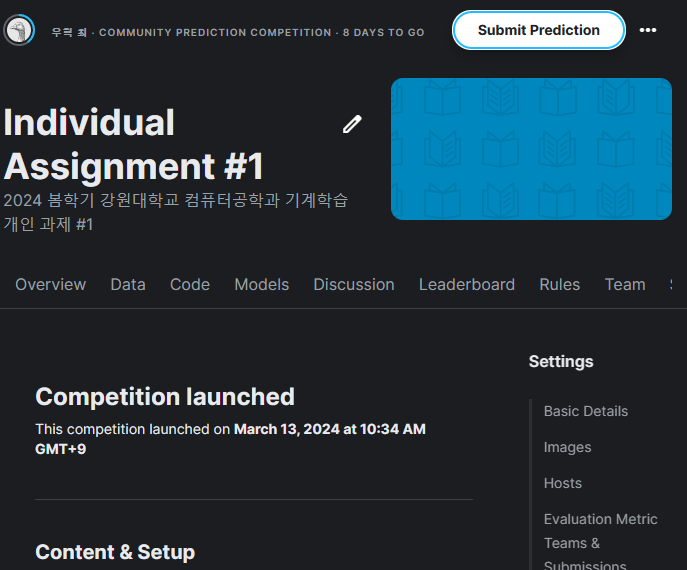

제출을 완료하게 되면 Leaderboard에서 자신의 순위를 알 수 있음

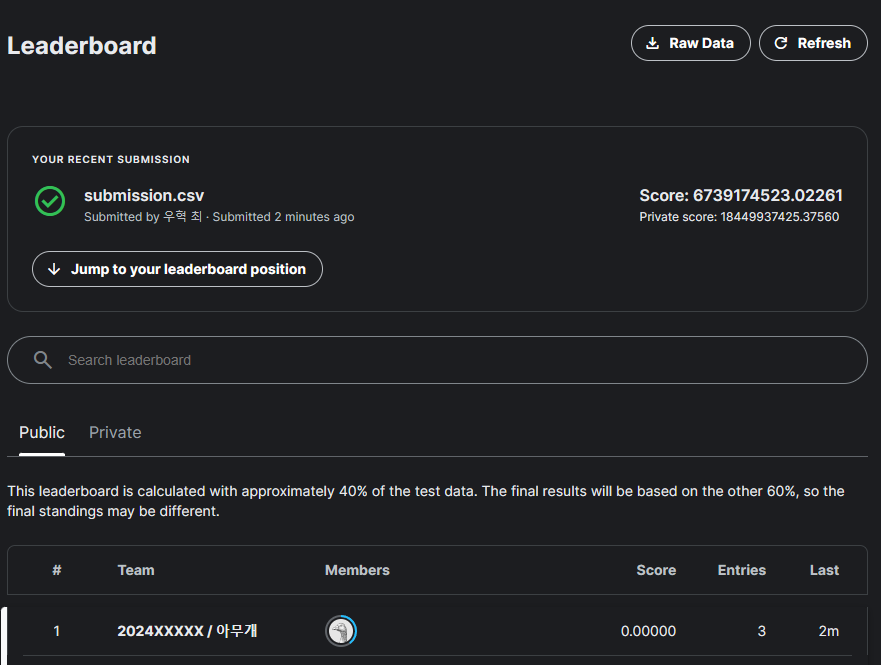

단, 공개되는 리더보드의 결과는 전체 테스트셋의 일부 데이터에 대해서면 측정한 것. 최종 결과는 Competition 종료 후에 공개됨. 이는 다음과 같은 Cheating을 방지하기 위함:
* 테스트셋의 참인 출력을 모르더라도, 성능치의 변화를 확인해서 손으로 출력값을 조정하면서 높은 성능을 만들어낼 수 있음
* 이를 방지하기 위해, (1) 일부 테스트 데이터에 대한 성능만을 보여주고, 나머지에 대해서는 숨기며, (2) 하루에 제출할 수 있는 횟수를 제한함

이 실습에서는 다음과 같은 설정이 존재:
* 40%의 테스트셋의 성능 결과를 Competition 리더보드에 공개; Competition이 종료된 후 최종 성능 결과를 공개
* 일일 제출 횟수는 5번

